In [21]:
pip install opendatasets --upgrade --quiet

In [22]:
import opendatasets as od
dataset_url = 'https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents'
od.download(dataset_url)

Skipping, found downloaded files in "./us-accidents" (use force=True to force download)


In [23]:
data_filename = "./usaccc/Us_accidents_report.csv"

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("dark_background")

In [25]:
df = pd.read_csv("/content/us-accidents/US_Accidents_March23.csv",nrows=2000000)
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [26]:
df.isnull().sum()

ID                             0
Source                         0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  2000000
End_Lng                  2000000
Distance(mi)                   0
Description                    4
Street                      1712
City                          47
County                         0
State                          0
Zipcode                      308
Country                        0
Timezone                    1453
Airport_Code                3705
Weather_Timestamp          23097
Temperature(F)             32958
Wind_Chill(F)             485289
Humidity(%)                35687
Pressure(in)               27131
Visibility(mi)             36852
Wind_Direction             35526
Wind_Speed(mph)           122331
Precipitation(in)         515863
Weather_Condition          35669
Amenity                        0
Bump      

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)       

# Data Cleaning

In [28]:
#remove most number of having null values columns
df.drop(columns=["End_Lat","End_Lng","Precipitation(in)","Wind_Chill(F)"],inplace=True)
#remove rows with null values

df.isnull().sum()

ID                            0
Source                        0
Severity                      0
Start_Time                    0
End_Time                      0
Start_Lat                     0
Start_Lng                     0
Distance(mi)                  0
Description                   4
Street                     1712
City                         47
County                        0
State                         0
Zipcode                     308
Country                       0
Timezone                   1453
Airport_Code               3705
Weather_Timestamp         23097
Temperature(F)            32958
Humidity(%)               35687
Pressure(in)              27131
Visibility(mi)            36852
Wind_Direction            35526
Wind_Speed(mph)          122331
Weather_Condition         35669
Amenity                       0
Bump                          0
Crossing                      0
Give_Way                      0
Junction                      0
No_Exit                       0
Railway 

In [29]:
df.describe()

,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph)
count,2.000000e+06,2.000000e+06,2.000000e+06,2.000000e+06,1.967042e+06,1.964313e+06,1.972869e+06,1.963148e+06,1.877669e+06
mean,2.318935e+00,3.605844e+01,-9.364373e+01,2.166527e-01,6.299356e+01,6.616150e+01,2.951607e+01,9.102687e+00,7.429139e+00
std,5.177706e-01,4.842643e+00,1.661899e+01,1.653574e+00,1.810324e+01,2.229775e+01,9.462990e-01,2.476175e+00,5.373457e+00
min,1.000000e+00,2.455480e+01,-1.244974e+02,0.000000e+00,-8.900000e+01,1.000000e+00,1.200000e-01,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.305089e+01,-1.118921e+02,0.000000e+00,5.100000e+01,5.000000e+01,2.930000e+01,1.000000e+01,4.600000e+00
50%,2.000000e+00,3.531118e+01,-8.744418e+01,0.000000e+00,6.500000e+01,6.900000e+01,2.980000e+01,1.000000e+01,7.000000e+00
75%,3.000000e+00,4.002456e+01,-8.085263e+01,0.000000e+00,7.700000e+01,8.500000e+01,3.000000e+01,1.000000e+01,1.000000e+01
max,4.000000e+00,4.900220e+01,-6.755331e+01,4.417500e+02,2.030000e+02,1.000000e+02,5.832000e+01,1.110000e+02,8.228000e+02


# EDA


**Locations**


1.   Which city have highest number of accidents ?
2.   Which state have highest number of accidents?





In [30]:
#city
cities = df["City"].value_counts(ascending=False)
cities

Houston        68395
Dallas         48848
Los Angeles    41154
Charlotte      40029
Austin         39188
               ...  
Rienzi             1
Dimmitt            1
Robards            1
Wahkiacus          1
Gatlinburg         1
Name: City, Length: 10295, dtype: int64

In [31]:
#unique valules in city
citiesUniq = df["City"].unique()
print(len(citiesUniq))

10296


Text(0.5, 0, 'City')

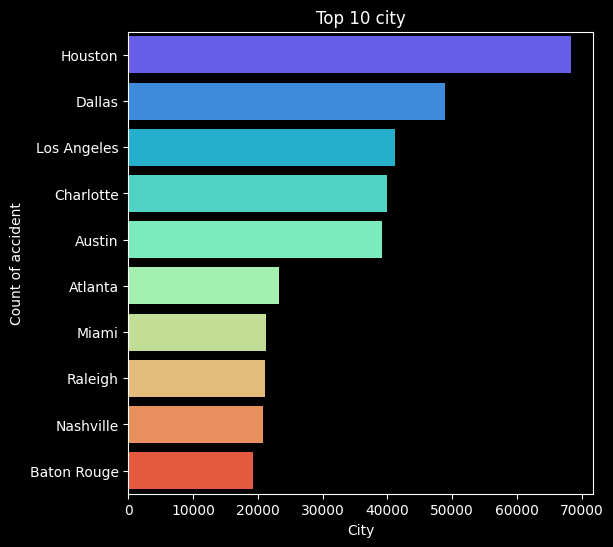

In [32]:
plt.figure(figsize=(6,6))
sns.barplot(y=df["City"].value_counts(ascending=False)[:10].index,x=df["City"].value_counts(ascending=False)[:10].values,palette="rainbow")
plt.title("Top 10 city")
plt.ylabel("Count of accident")
plt.xlabel("City")

Text(0.5, 0, 'City')

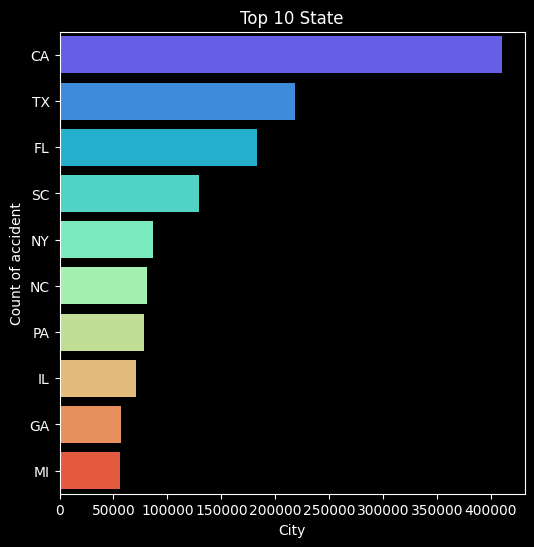

In [33]:
# State
plt.figure(figsize=(6,6))
sns.barplot(y=df["State"].value_counts(ascending=False)[:10].index,x=df["State"].value_counts(ascending=False)[:10].values,palette="rainbow")
plt.title("Top 10 State")
plt.ylabel("Count of accident")
plt.xlabel("City")

In [34]:
CA = df[df["State"]=="CA"]


Text(0.5, 0, 'City')

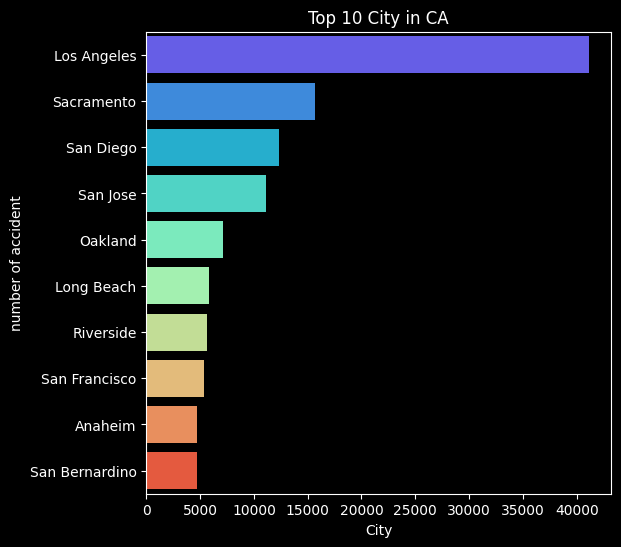

In [55]:
plt.figure(figsize=(6,6))
sns.barplot(y=CA["City"].value_counts(ascending=False)[:10].index,x=CA["City"].value_counts(ascending=False)[:10].values,palette="rainbow")
plt.title("Top 10 City in CA")
plt.ylabel("number of accident")
plt.xlabel("City")

Text(0.5, 0, 'City')

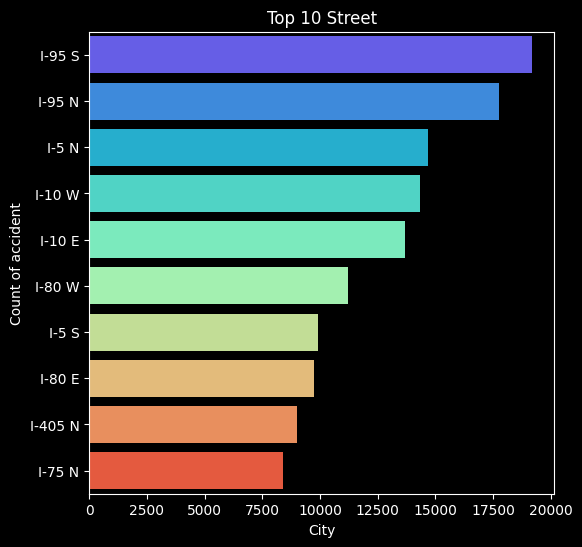

In [36]:
plt.figure(figsize=(6,6))
sns.barplot(y=df["Street"].value_counts(ascending=False)[:10].index,x=df["Street"].value_counts(ascending=False)[:10].values,palette="rainbow")
plt.title("Top 10 Street")
plt.ylabel("Count of accident")
plt.xlabel("City")

Text(0.5, 0, 'City')

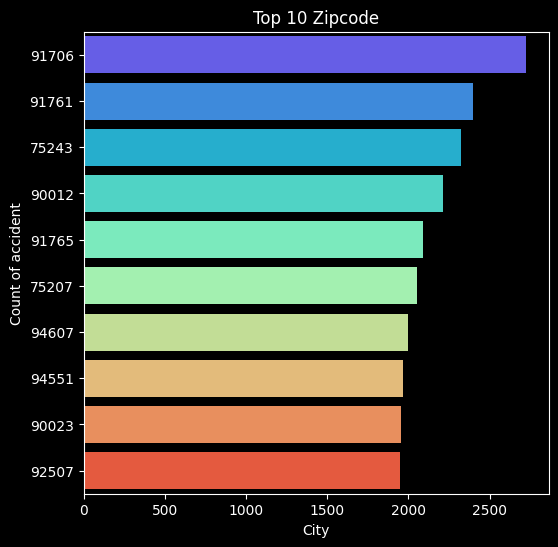

In [61]:
plt.figure(figsize=(6,6))
sns.barplot(y=df["Zipcode"].value_counts(ascending=False)[:10].index,x=df["Zipcode"].value_counts(ascending=False)[:10].values,palette="rainbow")
plt.title("Top 10 Zipcode")
plt.ylabel("Count of accident")
plt.xlabel("City")

**Time**


1.   Which day in the week has most accident occur?
2.   Which month in the year has most accident ocuur?

2.   At what time do accidents occur most frequently?


4.   Which year has most number of accident occur?








In [38]:
df["St_time"] = pd.to_datetime(df["Start_Time"])
df["hour"]=df["St_time"].dt.hour
df["month"]=df["St_time"].dt.month
df['week']= df['St_time'].dt.week
df['day']= df['St_time'].dt.dayofweek
df["quater"]=df["St_time"].dt.quarter
df["year"] = df["St_time"].dt.year
df["time"]=df["St_time"].dt.time
df.head()

<ipython-input-38-dd6159e3df9f>:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['week']= df['St_time'].dt.week


,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,...,Nautical_Twilight,Astronomical_Twilight,St_time,hour,month,week,day,quater,year,time
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,0.01,Right lane blocked due to accident on I-70 Eas...,I-70 E,...,Night,Night,2016-02-08 05:46:00,5,2,6,0,1,2016,05:46:00
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,0.01,Accident on Brice Rd at Tussing Rd. Expect del...,Brice Rd,...,Night,Day,2016-02-08 06:07:59,6,2,6,0,1,2016,06:07:59
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.01,Accident on OH-32 State Route 32 Westbound at ...,State Route 32,...,Day,Day,2016-02-08 06:49:27,6,2,6,0,1,2016,06:49:27
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,0.01,Accident on I-75 Southbound at Exits 52 52B US...,I-75 S,...,Day,Day,2016-02-08 07:23:34,7,2,6,0,1,2016,07:23:34
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,0.01,Accident on McEwen Rd at OH-725 Miamisburg Cen...,Miamisburg Centerville Rd,...,Day,Day,2016-02-08 07:39:07,7,2,6,0,1,2016,07:39:07


In [39]:
df.year.unique()

array([2016, 2017, 2022, 2021, 2020, 2019])

**Year wise classification**

In [40]:
df.Sunrise_Sunset.unique()

array(['Night', 'Day', nan], dtype=object)

In [41]:
s = ["Day","Night"]
df['Hue_Category'] = df['Sunrise_Sunset'].map(lambda x: x if x in s else 'Day')

In [42]:
len(df['Hue_Category'])

2000000

Text(0.5, 1.0, 'Year wise Number of Accidents')

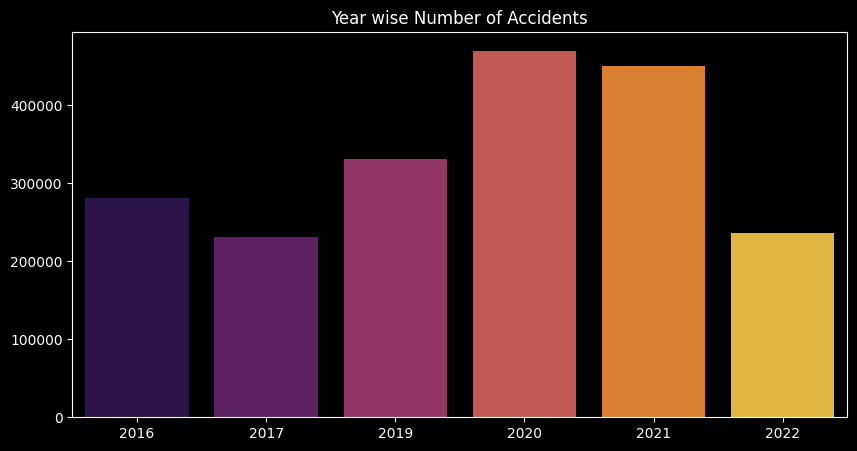

In [43]:
plt.figure(figsize =(10,5))
sns.barplot(x=df.year.value_counts().index,y=df.year.value_counts().values,palette="inferno")
plt.title("Year wise Number of Accidents")

Text(0.5, 1.0, 'month wise Number of Accidents')

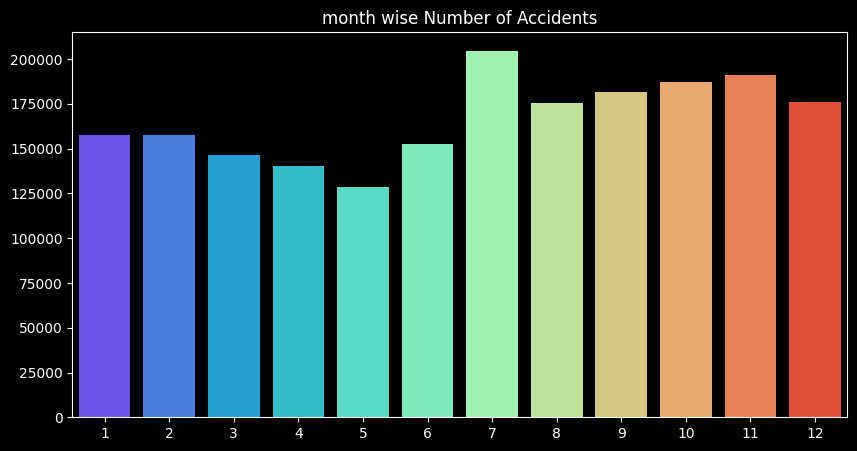

In [44]:
plt.figure(figsize =(10,5))
sns.barplot(x=df.month.value_counts().index,y=df.month.value_counts().values,palette="rainbow")
plt.title("month wise Number of Accidents")

In [45]:
day_mapping = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df["Days"]=df["day"].map(day_mapping)

<Axes: >

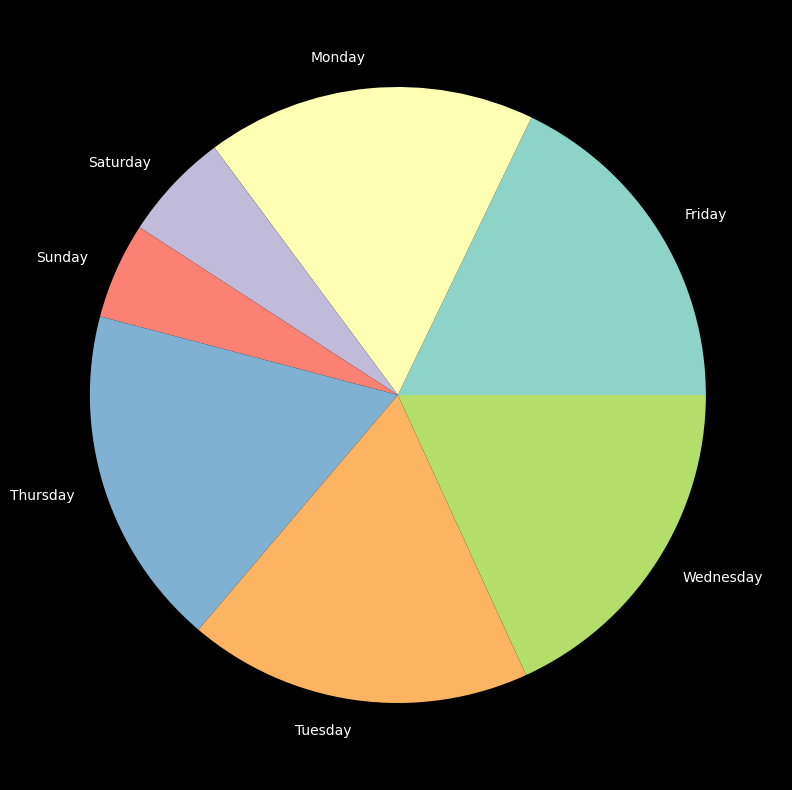

In [46]:
df.groupby(['Days']).size().plot.pie(figsize=(10,10))

<Axes: xlabel='hour'>

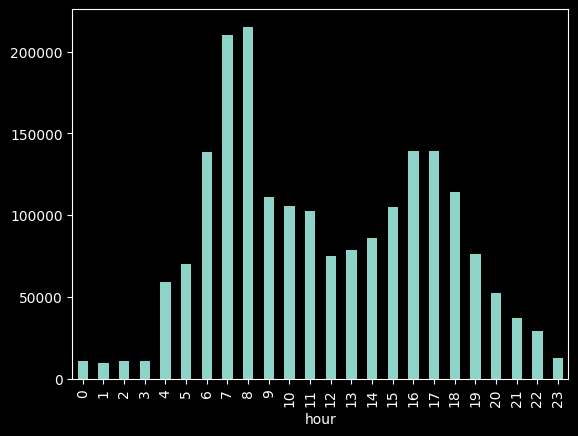

In [47]:
df.groupby(["hour"]).size().plot.bar()

In [48]:
mapi={1:"jan-mar",2:"Apr-jun",3:"jul-sep",4:"Oct-dec"}
df["quater"]=df["quater"].map(mapi)

Text(0.5, 1.0, 'Quater wise Number of Accidents')

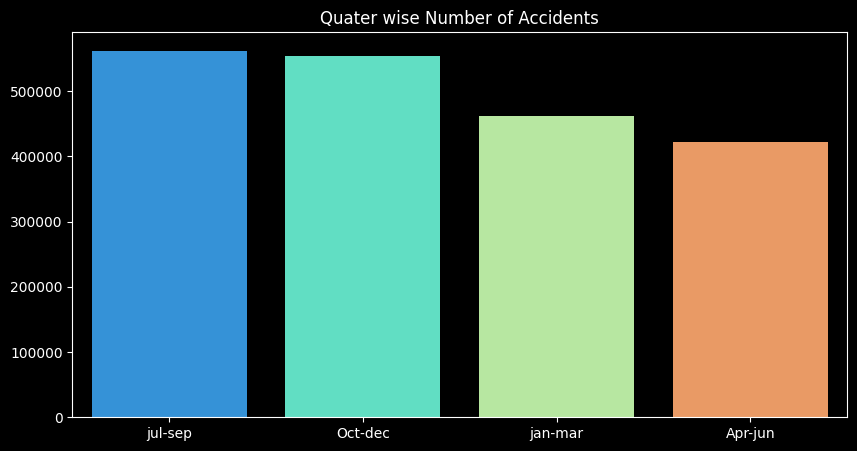

In [49]:
plt.figure(figsize =(10,5))
sns.barplot(x=df.quater.value_counts().index,y=df.quater.value_counts().values,palette="rainbow")
plt.title("Quater wise Number of Accidents")

Text(0.5, 1.0, 'number of accidents year/month')

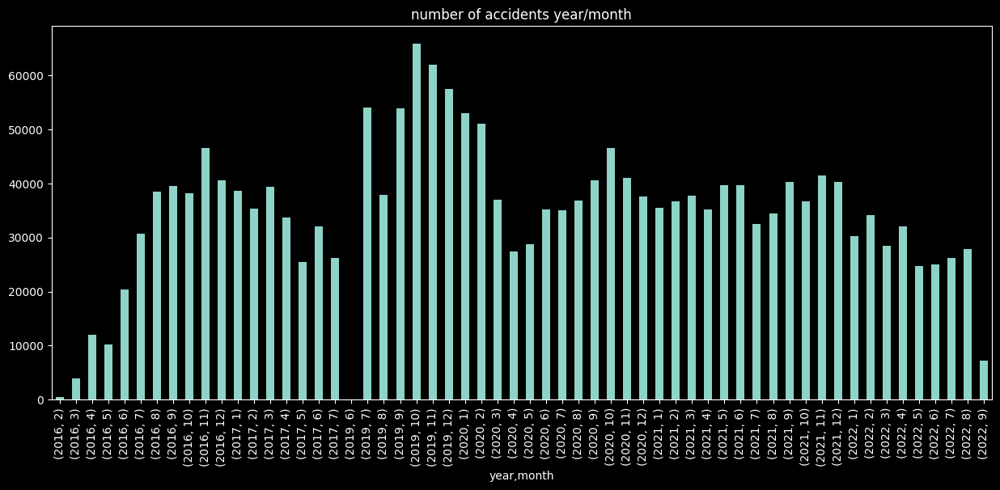

In [50]:
plt.figure(figsize=(15,6))
df.groupby(['year', 'month']).size().plot.bar()
plt.title("number of accidents year/month")


**What is the breakdown of accidents between day and night?**

<Axes: >

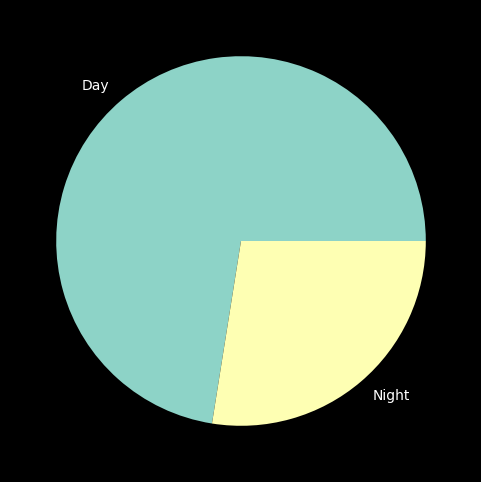

In [51]:
df.groupby(["Sunrise_Sunset"]).size().plot.pie(figsize=(6,6))

**Wheather Conditions**

1.   is colder temperature cause aciidents?
2.   temperature classification



In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 52 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   ID                     object        
 1   Source                 object        
 2   Severity               int64         
 3   Start_Time             object        
 4   End_Time               object        
 5   Start_Lat              float64       
 6   Start_Lng              float64       
 7   Distance(mi)           float64       
 8   Description            object        
 9   Street                 object        
 10  City                   object        
 11  County                 object        
 12  State                  object        
 13  Zipcode                object        
 14  Country                object        
 15  Timezone               object        
 16  Airport_Code           object        
 17  Weather_Timestamp      object        
 18  Temperature(F)        

In [53]:
df["Temperature(F)"].value_counts()

 73.0     49184
 77.0     48165
 68.0     46459
 72.0     46098
 75.0     44869
          ...  
-2.4          1
 100.8        1
 5.4          1
 9.9          1
 132.8        1
Name: Temperature(F), Length: 716, dtype: int64

In [68]:
df["Temperature(F)"].value_counts()

 73.0     49184
 77.0     48165
 68.0     46459
 72.0     46098
 75.0     44869
          ...  
-2.4          1
 100.8        1
 5.4          1
 9.9          1
 132.8        1
Name: Temperature(F), Length: 716, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
 [Text(0, 0, '21.0'),
  Text(1, 0, '23.0'),
  Text(2, 0, '24.0'),
  Text(3, 0, '25.0'),
  Text(4, 0, '26.0'),
  Text(5, 0, '27.0'),
  Text(6, 0, '28.0'),
  Text(7, 0, '29.0'),
  Text(8, 0, '30.0'),
  Text(9, 0, '31.0'),
  Text(10, 0, '32.0'),
  Text(11, 0, '33.0'),
  Text(12, 0, '34.0'),
  Text(13, 0, '35.0'),
  Text(14, 0, '36.0'),
  Text(15, 0, '37.0'),
  Text(16, 0, '38.0'),
  Text(17, 0, '39.0'),
  Text(18, 0, '40.0'),
  Text(19, 0, '41.0'),
  Text(20, 0, '42.0'),
  Text(21, 0, '43.0'),
  Text(22, 0, '44.0'),
  Text(23, 0, '45.0'),
  Text(2

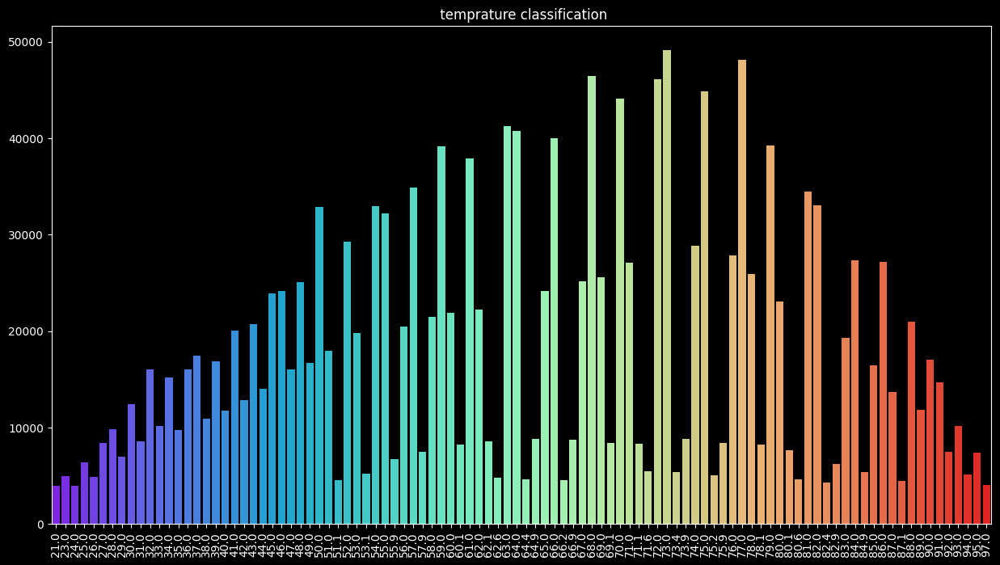

In [70]:
plt.figure(figsize =(15,8))
sns.barplot(x=df["Temperature(F)"].value_counts().head(100).index,y=df["Temperature(F)"].value_counts().head(100).values,palette="rainbow")
plt.title(" temprature classification")
plt.xticks(rotation=90)

In [71]:
df['day_zone'] = pd.cut((df['hour']),bins=(0,6,12,18,24), labels=["night", "morning", "afternoon", "evening"])

In [ ]:
plt.figure(figsize =(6,6))
sns.barplot(x=df["day_zone"].value_counts().index,y=df["day_zone"].value_counts().values,palette="rainbow")
plt.title("Time wise classified")
plt.xticks(rotation=90)

In [75]:
pip install wordcloud --quiet

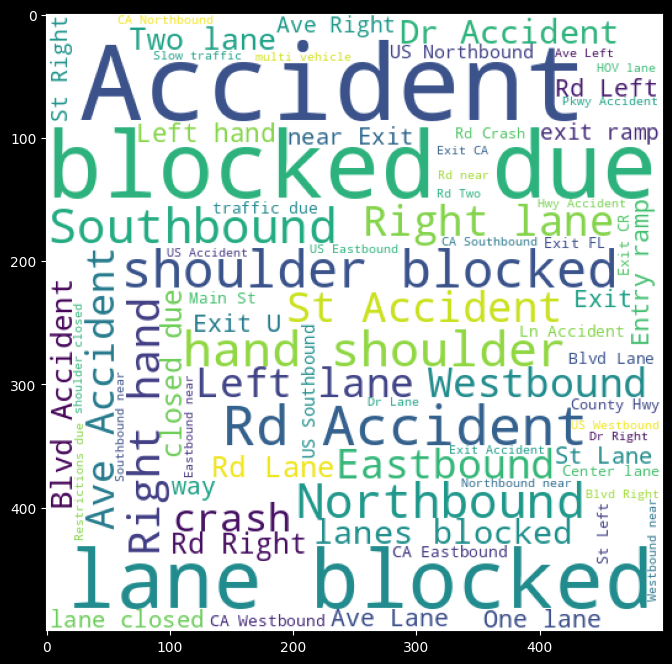

In [78]:
from wordcloud import WordCloud

wc = WordCloud(width=500,height=500,min_font_size=10,background_color='white')

wordclou = wc.generate(df['Description'].str.cat(sep=" "))

plt.figure(figsize=(12,8))
plt.imshow(wordclou)

In [91]:
import folium
from folium.plugins import HeatMap

# fg=folium.FeatureGroup(name="terrormap")
# acc_map =  folium.Map()
a_list=df[["Start_Lat","Start_Lng"]].values[:500000].tolist()

# for i in a_list:
#   folium.CircleMarker(location=[i[0],i[1]],popup=i[2],radius=1,color="red").add_to(acc_map)
map = folium.Map()
HeatMap(a_list).add_to(map)
map
